**DSCI 100 09 Group 04 Project Proposal - Pulsar Star Dataset**

**Introduction**

"The HTRU2 dataset consists of pulsar candidates from the High Time Resolution Universe Survey (South)." Pulsars are a type of Neutron star that rotate rapidly and emit radio signals. Their unique radio emission patterns hold scientific significance and require labelling individualistic pulsar candidates into two classes: 0 (Negative/Spurious) and 1 (Positive/Real Pulsar).

With this dataset, we want to determine the relationship between the transmitted radio waves of pulsar stars, visualize the strong relationships between variables, and eventually create a KNN classification model to help classify new incoming observations based off of the current dataset as a training set. More specifically, we want to visualize and observe how the **skewness** and **kurtosis** can determine the class of a pulsar star.

In [1]:
library(tidyverse) 
library(repr)
library(tidymodels)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.4     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

The total set of variables per image in this data set is:

1. Mean_IP: Mean of the integrated profile.
2. SD_IP:. Standard deviation of the integrated profile.
3. Kurtosis_IP: Excess kurtosis of the integrated profile
4. Skewness_IP: Skewness of the integrated profile.
5. Mean_DM_SNR : Mean of the DM-SNR.
6. SD_DM_SNR: Standard deviation of the DM-SNR.
7. Kurtosis_DM_SNR: Excess kurtosis of the DM-SNR. 
8. Skewness_DM-SNR: Skewness of the DM-SNR 
9. Class: The diagnosis (0 = spurious examples(non-real), 1 = real pulsar examples)


In [2]:
 pulsar_data <- read_csv("https://raw.githubusercontent.com/jesquachi/dsci-100-09-group-04-project/main/HTRU_2.csv", 
                         col_names = FALSE) |>   #reading data into rand giving the column readable names
                            rename(Mean_IP = X1,
                                   SD_IP = X2,
                                   Kurtosis_IP = X3,
                                   Skewness_IP = X4,
                                   Mean_DM_SNR = X5,
                                   SD_DM_SNR = X6,
                                   Kurtosis_DM_SNR = X7,
                                   Skewness_DM_SNR = X8,
                                   Class = X9) |>
                            mutate(Class = as_factor(Class)) |>
                            mutate(Class = fct_recode(Class, "Spurious" = "0", "Real Pulsar" = "1"))

#glimpse(pulsar_data)  #seeing how many rows exist in the dataset

pulsar_data |>
distinct(Class)  #checking the distinct classes in the dataset

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): X1, X2, X3, X4, X5, X6, X7, X8, X9

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Class
<fct>
Spurious
Real Pulsar


**Summarizing Data using training data**

In [3]:
#Finding out how many observations belong to each class as well as the percentage of each class

obs <- nrow(pulsar_data)
pulsar_data |>
  group_by(Class) |>
  summarize(
    count = n(),
    percentage = n() / obs * 100) 


Class,count,percentage
<fct>,<int>,<dbl>
Spurious,16259,90.842552
Real Pulsar,1639,9.157448


In [4]:
# Dropping any missing values

pulsar_data <- pulsar_data |> drop_na()

# Splitting data into training and testing sets

pulsar_split <- initial_split(pulsar_data, prop = 0.75, strata = Class)
pulsar_train <- training(pulsar_split)
pulsar_test <- testing(pulsar_split) 
#Glimpse(pulsar_train)
#Glimpse(pulsar_test)


# Finding out how many observations belong to each class as well as the percentage of each class for training set


obs_train <- nrow(pulsar_train)
pulsar_train |>
  group_by(Class) |>
  summarize(
    count = n(),
    percentage = n() / obs_train * 100)

# finding the mean of every variable

pulsar_mean <- pulsar_train |>
select(Mean_IP:Skewness_DM_SNR) |>
map_dfr(mean)

pulsar_mean


Class,count,percentage
<fct>,<int>,<dbl>
Spurious,12212,90.978172
Real Pulsar,1211,9.021828


Mean_IP,SD_IP,Kurtosis_IP,Skewness_IP,Mean_DM_SNR,SD_DM_SNR,Kurtosis_DM_SNR,Skewness_DM_SNR
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
111.2128,46.56303,0.4749845,1.756367,12.69837,26.35264,8.310028,105.1816




Now we want to visualize and compare the **skewness** and **kurtosis** from the two different sources (**Integrated Profile** and **DM-SNR**).



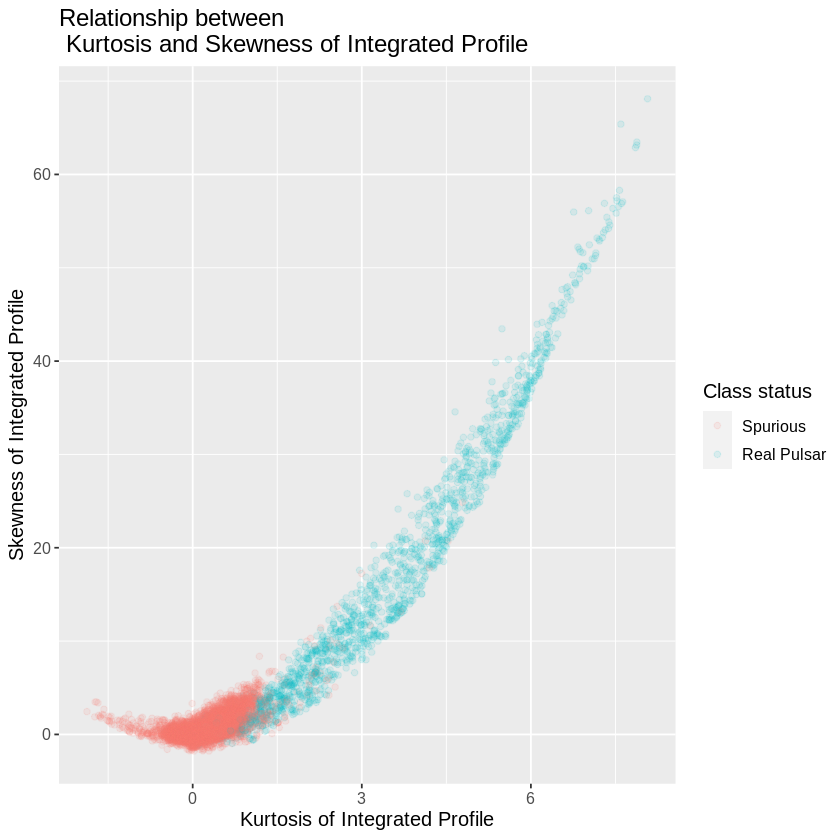

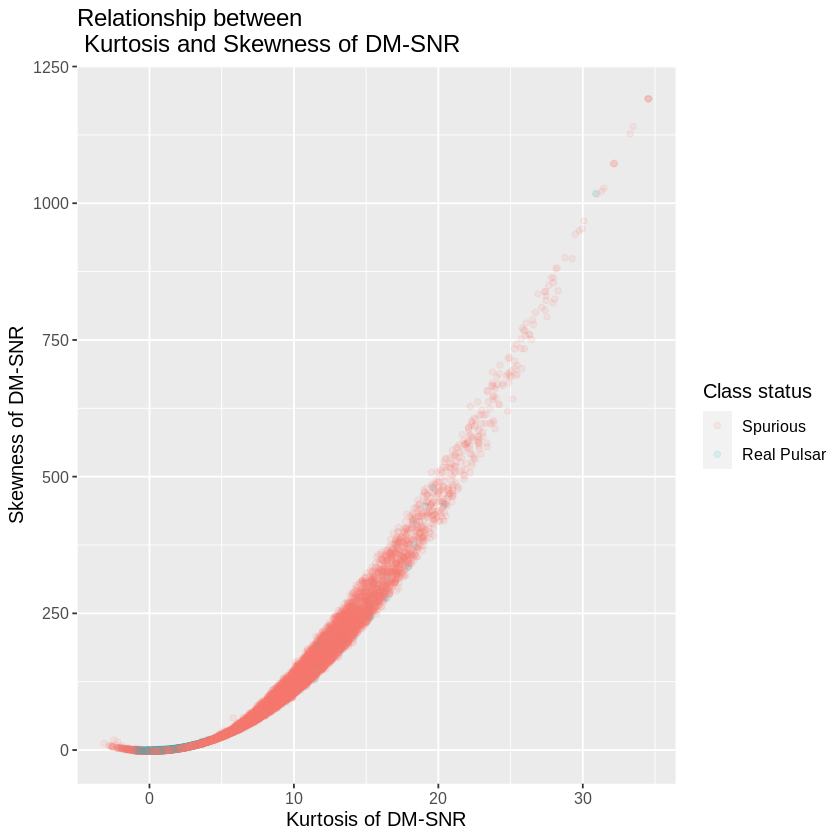

In [5]:
#CLEAN AND WRANGLE DATA

Kurtosis_IP_Skewness_IP <- pulsar_data |>
  ggplot(aes(x = Kurtosis_IP, y = Skewness_IP, color = Class)) +
  geom_point(alpha = 0.1) +
  labs(x = "Kurtosis of Integrated Profile", 
       y = "Skewness of Integrated Profile", 
       color = "Class status",
       title = "Relationship between \n Kurtosis and Skewness of Integrated Profile") +
  theme(text = element_text(size = 12))
Kurtosis_IP_Skewness_IP 

Kurtosis_Skewness_DM_SNR <- pulsar_data |>
  ggplot(aes(x = Kurtosis_DM_SNR, y = Skewness_DM_SNR, color = Class)) +
  geom_point(alpha = 0.1) +
  labs(x = "Kurtosis of DM-SNR", 
       y = "Skewness of DM-SNR", 
       color = "Class status",
       title = "Relationship between \n Kurtosis and Skewness of DM-SNR") +
  theme(text = element_text(size = 12))
Kurtosis_Skewness_DM_SNR

From the two graphs above, there seems to be a stronger relationship positive between the **skewness** and **kurtosis** data obtained from the **integrated profile** compared to the data obtained from the DM-SNR. Therefore the ideal variable to build our classification model on would be the **skewness** and **kurtosis** of the **integrated profiles**, as it appears to give a clearer analysis and definition to classifying the class of pulsar stars.

**Methods**

In our data analysis, we are conducting classification using the variables 'skewness of the integrated profile' and 'excess kurtosis of the integrated profile.' To accomplish this classification task, we will use the K Nearest Neighbours algorithm. We will begin by with wrangling our data (as done above), making sure it is tidy before we start creating a model recipe. After we create a model recipe (with scaled values), we train our dataset using the K-nearest function, selecting the most appropriate value for K. Then, we will use the *fit* function to apply this model specification to our dataset. All these steps will be combined using the *workflow* function.

After creating this workflow, we will use our testing set to test the model and create folds to optimize accuracy before continuing to create a coloured prediction map visualization.

**Expected Outcomes and Significance**

*What do you expect to find?*

We expect to create a KNN classification model that will be capable of distinguishing between real pulsars and false similar candidates, as well as patterns between these features and class labels.

*What impact could such findings have?*

The impact of the findings can be significant for the scientific community. Precise pulsar candidate classification can improve our understanding of these neutron stars and their outflows. Using technology, astronomical data can be simplified which aids in increasing the efficiency and accuracy of astronomical studies and pulsar identification

*What future questions could this lead to?*

Prospective research questions encompass investigating more complex engineering for improved classification, expanding the positive class' size, possibly extending the model's application to other celestial objects.